# Illustrating the relationship between random walks and diffusion

Imagine a group of particles that are initially arranged in a vertical line, and then start undergoing random motions. The simulation below illustrates how they spread out over time.

## Part 1: create the model and set up the animation

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [2]:
class RandomWalkSimulator(object):
    
    def __init__(self, num_particles=100, num_types=1, initial_position='line',
                 step_size=0.01):
        """Initialize the RandomWalkSimulator
        
        Parameters
        ----------
        num_particles : int (default = 100)
            number of particles
        num_types : int (default = 1)
            number of particle 'types,' each of which will be in a different color
        initial_position : string ('line' or 'scatter')
            'line' means all particles are lined up along the y axis.
            'scatter' means they are scattered, with type 1 between -1 and 0, and type 2
            (if present) between 0 and 1.
        step_size : float (default = 0.01)
            Scale factor for size of random steps.
        """
        self.np = num_particles
        self.nt = num_types
        self.step_size = step_size
        self.x = np.zeros((num_particles, num_types))
        self.y = np.zeros((num_particles, num_types))
        if initial_position == 'line':
            self.x[:] = 0.0
            for j in range(num_types):
                self.y[:, j] = np.linspace(0, 1, num_particles)
        else:
            for j in range(num_types):
                self.x[:, j] = np.random.rand(num_particles) - (j % 2)
                self.y[:, j] = np.random.rand(num_particles)

    def run_one_step(self):
        """Apply one random offset to each particle"""
        dx = np.random.rand(self.np, self.nt) * np.sign(2 * np.random.rand(self.np, self.nt) - 1)
        dy = np.sqrt(1.0 - dx**2) * np.sign(2 * np.random.rand(self.np, self.nt) - 1)
        self.x[:] += self.step_size * dx  # Scale by dr
        self.y[:] += self.step_size * dy  #  "


In [3]:
rws = RandomWalkSimulator(num_particles=1000)

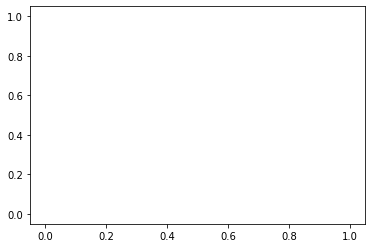

In [4]:
# First, set up a blank figure
fig, ax = plt.subplots()  

# And placeholder lists for data
obj = ax.plot([], [], color = 'k')

# And initialize the number of iterations per animation frame
num_iter_per_frame = 10

In [5]:
def init():
    ax.set_xlim(-1, 1)
    ax.set_ylim(0, 1)
    obj = ax.plot(rws.x, rws.y, '.')
    return(obj)

In [6]:
# Next, define the update function
def update(i):
    for j in range(num_iter_per_frame):
        rws.run_one_step()
    ax.cla()
    ax.set_xlim(-1, 1)
    ax.set_ylim(0, 1)
    for j in range(rws.nt):
        obj = ax.plot(rws.x[:, j], rws.y[:, j], '.')

    return(obj)

## Part 2: Run and animate the model with particles initially evenly spaced along a vertical line

Note that the `FuncAnimation` function automatically runs our model by iteratively calling the `update` function, which in turn calls the `rws.run_one_step` function to advance the model.


In [7]:
# Run the animation!
anim = FuncAnimation(fig, update, 300, init_func = init, blit = True)
plt.show()

In [8]:
# Convert the animation to HTML
vid = HTML(anim.to_html5_video())

In [9]:
vid

## Part 3: run and animate the model with two groups of particles, one on each side of the domain

In [10]:
rws2 = RandomWalkSimulator(num_particles=1000, num_types=2, initial_position='scatter')

In [11]:
def init2():
    ax.set_xlim(-1, 1)
    ax.set_ylim(0, 1)
    obj2 = ax.plot(rws2.x, rws2.y, '.')
    return(obj2)

In [12]:
# Next, define the update function
def update2(i):
    for j in range(num_iter_per_frame):
        rws2.run_one_step()
    ax.cla()
    ax.set_xlim(-1, 1)
    ax.set_ylim(0, 1)
    for j in range(rws2.nt):
        obj2 = ax.plot(rws2.x[:, j], rws2.y[:, j], '.')

    return(obj2)

In [13]:
# Run the animation!
anim = FuncAnimation(fig, update2, 300, init_func = init2, blit = True)
plt.show()

In [14]:
# Convert the animation to HTML
vid2 = HTML(anim.to_html5_video())

In [15]:
vid2

Notice that the two populations gradually mix together.